# Raj News Customer Counter

This jupyter notebook was used to import, treat and collate different sets of data so that it could then be normalised to identify correlations and visualise the data. This is important as the time series analysis will make it easy to identify trends and relvant information from the sensing process

### Importing Packages
The following code imports the required packages for the processes below

In [1]:
import pandas as pd
import time
import gspread
from oauth2client.service_account import ServiceAccountCredentials
import numpy as np
import calendar
import datetime
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from IPython.core.interactiveshell import InteractiveShell
from statistics import mean
import statsmodels.api as sm

InteractiveShell.ast_node_interactivity = "all"

### Importing the data
In order to allow for live updating the data was imported from google sheets from a publicly available sheet, therefore the credentials used in section one were no longer required. For the main Data file the timestamp was copied and made into an index that can be used for sorting.<br/>
There are two sheets imported: 
- [Buses](https://docs.google.com/spreadsheets/d/1jF6BnwFjvGX22rJBAAI2SIUarwn80xDg5BX9ibNK3LQ/edit#gid=0)
- [SIOT_data](https://docs.google.com/spreadsheets/d/1xcq5qQa7iU6hwyEIm4hjqJke9Jkm6sAgvpIDZmGLjiU/edit#gid=0)

Buses is made up of specific data concerning the buses arriving in the local vicinity including an ID and a timestamp.
Data includes values for number of people walking together in groups and the associated weather patterns and a timestamp

In [2]:
buses = pd.read_csv('https://docs.google.com/spreadsheets/d/' + 
                   '1jF6BnwFjvGX22rJBAAI2SIUarwn80xDg5BX9ibNK3LQ' +
                   '/export?gid=0&format=csv')
buses.head()
data = pd.read_csv('https://docs.google.com/spreadsheets/d/' + 
                   '1xcq5qQa7iU6hwyEIm4hjqJke9Jkm6sAgvpIDZmGLjiU' +
                   '/export?gid=0&format=csv',
                   # Set first column as rownames in data frame
                   index_col=0,
                   # Parse column values to datetime
                   parse_dates=['index']
                  )
data.head()
weather_only = pd.read_csv('https://docs.google.com/spreadsheets/d/' + 
                   '18OeCDUW1vLrQjtoSGNp-_W1JxIYZqsq5gobqcxjmEYk' +
                   '/export?gid=0&format=csv',
                  )
weather_only.head()

,id,bus_number,arrival,ts,direction
0,1437176440,77,Thu Jan 2 06:26:53 2020,1577946413,to
1,368064856,452,Thu Jan 2 06:28:13 2020,1577946493,to
2,1085502742,87,Thu Jan 2 06:31:52 2020,1577946712,from
3,-382937601,452,Thu Jan 2 06:31:53 2020,1577946713,from
4,-808330398,87,Thu Jan 2 06:34:42 2020,1577946883,to


,section_counter,main,description,feels_like,temp,clouds,wind_speed,recent_buses,most_recent,timestamp
index,,,,,,,,,,
2020-01-01 14:01:19,1,Clouds,overcast clouds,276.47,278.89,90,1.5,NaN,NaN,Wed Jan 1 14:01:19 2020
2020-01-01 14:02:03,1,Clouds,overcast clouds,276.47,278.89,90,1.5,1835521675 1975014712,1.975015e+09,Wed Jan 1 14:02:03 2020
2020-01-01 14:03:08,2,Clouds,overcast clouds,276.47,278.89,90,1.5,-418295595 1835521675 1975014712,1.975015e+09,Wed Jan 1 14:03:08 2020
2020-01-01 14:03:27,1,Clouds,overcast clouds,276.47,278.89,90,1.5,-418295595 1835521675 1975014712,1.975015e+09,Wed Jan 1 14:03:27 2020
2020-01-01 14:04:04,1,Clouds,overcast clouds,276.47,278.89,90,1.5,-418295595 1975014712 188714585,1.887146e+08,Wed Jan 1 14:04:04 2020


,main,description,feels_like,temp,clouds,wind_speed,timestamp
0,Clouds,overcast clouds,276.54,279.89,90,3.1,1577947114
1,Clouds,overcast clouds,276.53,279.88,90,3.1,1577947490
2,Clouds,overcast clouds,276.52,279.87,90,3.1,1577947704
3,Clouds,overcast clouds,276.57,279.91,90,3.1,1577948126
4,Clouds,overcast clouds,276.59,279.93,90,3.1,1577948329


## Data Structure

### Adding columns
The data required reformatting of the timestamp columns to make it easier to compare the two sheets values and so a value for time since timestamp(0) was used. This allows mathematic manipulation of time data

### Qualitative data
Data that was qualitative was reformatted to be quantiative for future processing

In [3]:
def structts(x):
    return calendar.timegm(time.strptime(x))

def unix_time(dt):
    epoch = datetime.datetime.utcfromtimestamp(0)
    delta = dt - epoch
    return delta.total_seconds()


In [4]:
timestamp = data['timestamp'].apply(structts)
data['ts'] = timestamp

Weather = {'Clouds': 1,'Haze' :2, 'Rain':4,'Drizzle': 3,'Mist':2,'Clear':0} 
Detail_weather = { 
    'clear sky': 1,
    'broken clouds': 2,
    'drizzle': 5,
    'few clouds' : 2,
    'haze': 3,
    'heavy intensity rain': 8,
    'light intensity drizzle': 4,
    'light intensity drizzle rain': 6,
    'light rain': 6,
    'mist': 3,
    'moderate rain': 7,
    'overcast clouds': 3,
    'scattered clouds': 2,
    'shower rain': 7
}

data_words = data.copy()
data['description'] = [Detail_weather[item] for item in data.description]
data['main'] = [Weather[item] for item in data.main]
data = data.drop([item for item in data.index if item.day == 1], axis = 0)
data = data.drop([item for item in data.index if data.loc[item]['section_counter'] == 1], axis = 0)
data = data.drop([item for item in data.index if data.loc[item]['section_counter'] == 0], axis = 0)


In [5]:
#data = data.drop([item for item in data.index if data.loc[item]['section_counter'] == 1], axis = 0)
#data = data.drop([item for item in data.index if data.loc[item]['section_counter'] == 0], axis = 0)

### Combining data
Due to the use of two sheets it was also required to combine them based on timestamps to identify the most recent buses. In the future this would be done in the collection stage but was done by identify mathching IDs accross the two sets of data and then finding the most appropiate timestamp for the matching ID

In [6]:
def checkForId(x):
    bus = buses.loc[buses['id'] == int(x)]
    if bus.empty != True:
        return bus
    else:
        return False
def deltaOfbus(colname, seconds):
    if colname in data.columns:
        return
    data[colname]=None
    data['bus_number'] = None
    data['bus_direction'] = None
    failed = 0
    for i in range(data.shape[0]):
        busid = data.iat[i,8]
        try:
            bus = checkForId(busid) #50 = i
            bus_number = bus.iat[0,1]
            bus_direction = bus.iat[0,4]
            deltas=[]
            for j in range(bus.shape[0]):
                delta = data.iat[i,10] - bus.iat[j,3] 
                if delta > 0:
                    deltas.append(delta)
            if len(deltas) != 0:
                smallest = (min(deltas))
                if smallest < seconds:
                    #print(smallest)
                    data.iat[i,data.shape[1]-3] = smallest
                    data.iat[i,data.shape[1]-2] = bus_number
                    data.iat[i,data.shape[1]-1] = bus_direction
        except ValueError:
            failed += 1
            pass
        except AttributeError:
            failed += 1
            pass
deltaOfbus('0.5min',180)


In [7]:
# matplotlib configuration

plt.rcParams["font.family"] = "serif"
plt.rcParams["savefig.dpi"] = 300
plt.rcParams["figure.dpi"] = 150
plt.rcParams['figure.figsize'] = 20, 10

def newfigure(*args, **kwargs):
    fig, ax = plt.subplots(*args, **kwargs)
    for i, a in enumerate(fig.axes):
        a.tick_params(direction='in', grid_linestyle=":", top=True, right=True)
        a.grid(which='major', axis='both', linestyle=":")
    return fig, ax

Text(0, 0.5, 'Store activity')

Text(0.5, 1.0, 'Data showing Store Activity over period of 10 days')

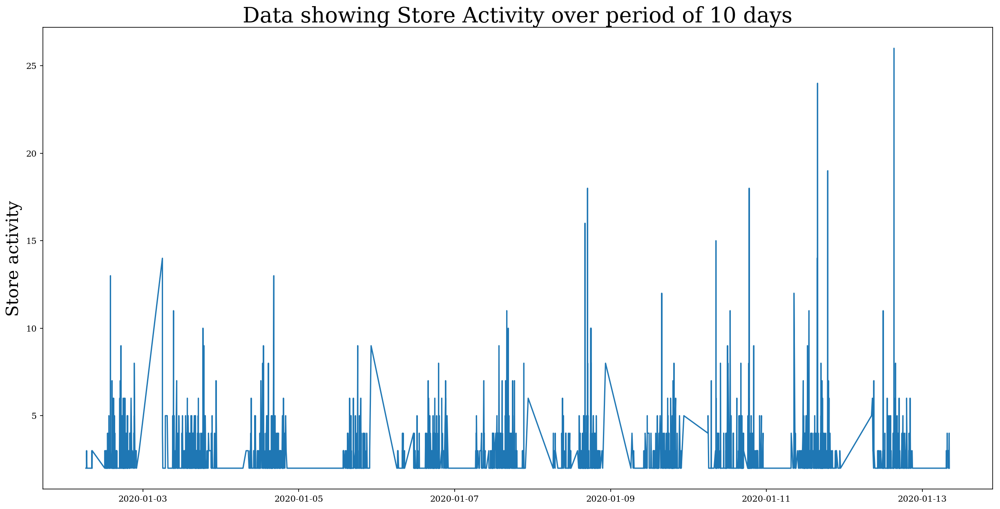

In [8]:
plt.plot(data['section_counter'])
plt.ylabel("Store activity", fontsize= 20)
plt.title('Data showing Store Activity over period of 10 days', fontsize=25)
plt.savefig("./graphs/Data_showing_store_activity_10.png")

In [9]:
def totalToTime(x):
    return time.ctime(int(x))

timestamp = weather_only['timestamp'].apply(totalToTime)
weather_only['ts'] = timestamp
weather_only.to_csv('temp.csv')
weather_only = pd.read_csv('temp.csv',index_col=['ts'],parse_dates=['ts'])

Text(0, 0.5, 'Temperature')

Text(0.5, 1.0, 'Temperature across 10 days')

Text(0.5, 1.0, 'Qualitative weather across 10 days')

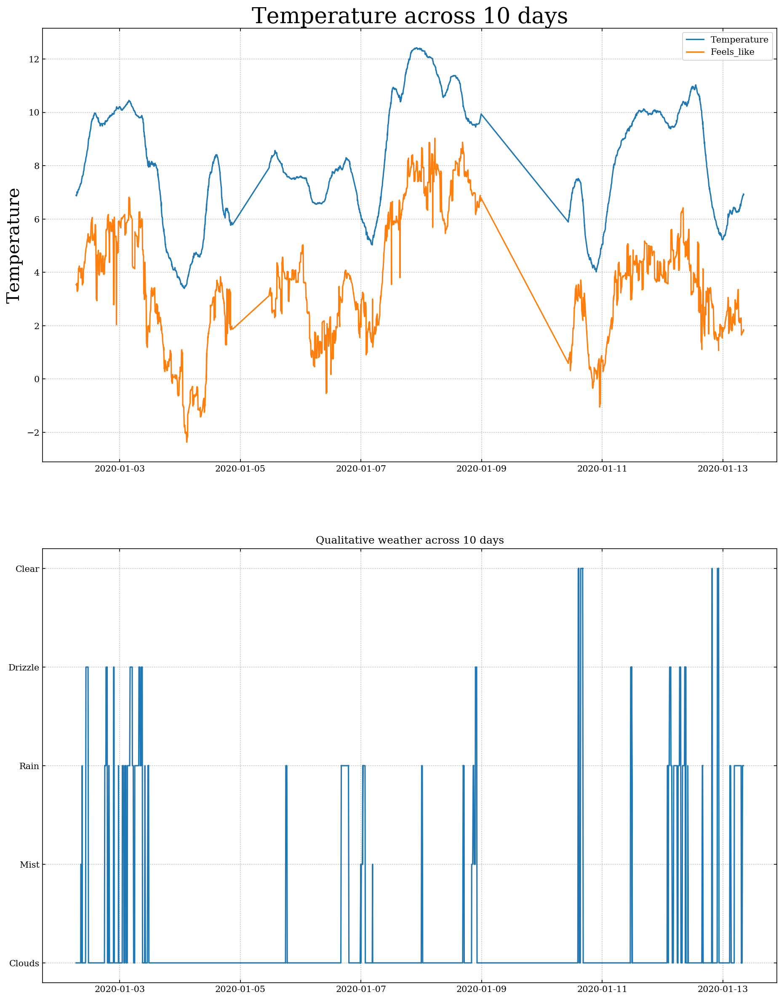

In [10]:
fig, ax = newfigure(2, figsize=(15,20))

ax[0].plot(weather_only.index,weather_only['temp']-273, label = 'Temperature')
ax[0].plot(weather_only.index, weather_only['feels_like']-273, label = 'Feels_like')
ax[0].legend()

ax[0].set_ylabel("Temperature", fontsize= 20)
ax[0].set_title('Temperature across 10 days', fontsize=25)
ax[1].set_title('Qualitative weather across 10 days')
ax[1].plot(weather_only.index,weather_only['main'])
fig.savefig("./graphs/Data_showing_store_activity_10.png")



In [11]:
Weather = {'Clouds': 1,'Haze' :2, 'Rain':4,'Drizzle': 3,'Mist':2,'Clear':0} 
Detail_weather = { 
    'clear sky': 1,
    'broken clouds': 2,
    'drizzle': 5,
    'few clouds' : 2,
    'haze': 3,
    'heavy intensity rain': 8,
    'light intensity drizzle': 4,
    'light intensity drizzle rain': 6,
    'light rain': 6,
    'mist': 3,
    'moderate rain': 7,
    'overcast clouds': 3,
    'scattered clouds': 2,
    'shower rain': 7,
    'drizzle rain': 6
}
weather_only['description'] = [Detail_weather[item] for item in weather_only.description]
weather_only['main'] = [Weather[item] for item in weather_only.main]
def count_recent_buses(x):
    if x == 0: 
        return 0
    else:
        x = x.split()
        return len(x)
data['recent_buses']=data['recent_buses'].fillna(0)
data['recent_buses'] = data['recent_buses'].apply(count_recent_buses)

### Resampling
The current data is dependant on when users walked in and is therefore difficult to process due to the random nature of it. Therefore the data was resampled for every hour and every day summing and meaning the values.
Once it was resampled for every hour a function could be written to understand the rough average sales per hour on a daily basis

In [12]:
data = data.fillna(0)
sum_data_hour = data.resample('1H').sum()  
mean_data_hour = data.resample('1H').mean()
mean_data_hour = mean_data_hour.fillna(0)
sum_data_day = data.resample('24H').sum()
mean_data_day = data.resample('24H').sum()

for i, name in enumerate(sum_data_hour.columns.values):
    sum_data_hour[name] = sum_data_hour[name].interpolate('linear') 
for i, name in enumerate(mean_data_hour.columns.values):
    mean_data_hour[name] = mean_data_hour[name].interpolate('linear') 

def valuesEveryHour(data):
    times = range(6,23)
    w_times = ['06:00','07:00','08:00','09:00','10:00','11:00','12:00','13:00','14:00','15:00',
               '16:00','17:00','18:00','19:00', '20:00', '21:00','22:00']
    totals = []
    for i in times:
        sectioncounter = []
        for timestamp in data.index:
            if timestamp.hour == i:
                if data['section_counter'][timestamp] != 0:
                    sectioncounter.append(data['section_counter'][timestamp])
        sectioncounter = mean(sectioncounter)
        totals.append(sectioncounter)
    return w_times, totals
dailyHours, dailyHoursTotals = valuesEveryHour(sum_data_hour)

Text(0, 0.5, 'Temperature in deg C')

Text(0, 0.5, 'Numbers of people per group')

Text(0, 0.5, 'Numbers of people/hour')

<BarContainer object of 17 artists>

Text(0, 0.5, 'Store activity/hour')

Text(0.5, 1.0, 'Average score activity across the ten days')

<BarContainer object of 12 artists>

Text(0, 0.5, 'Average total/day')

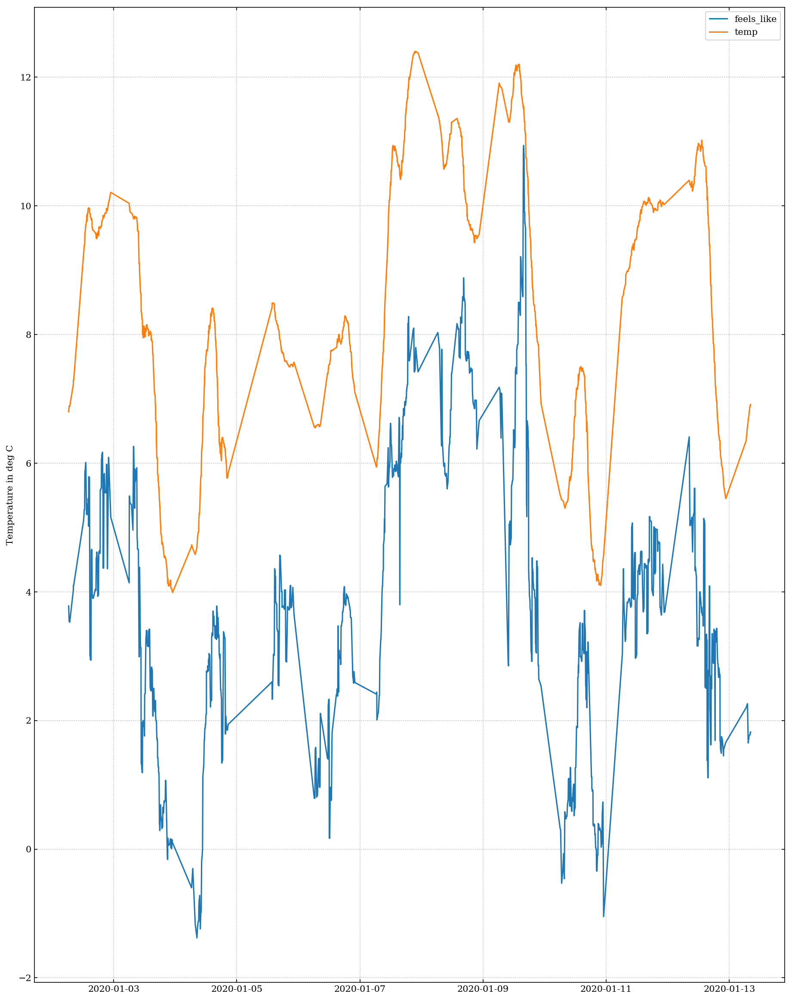

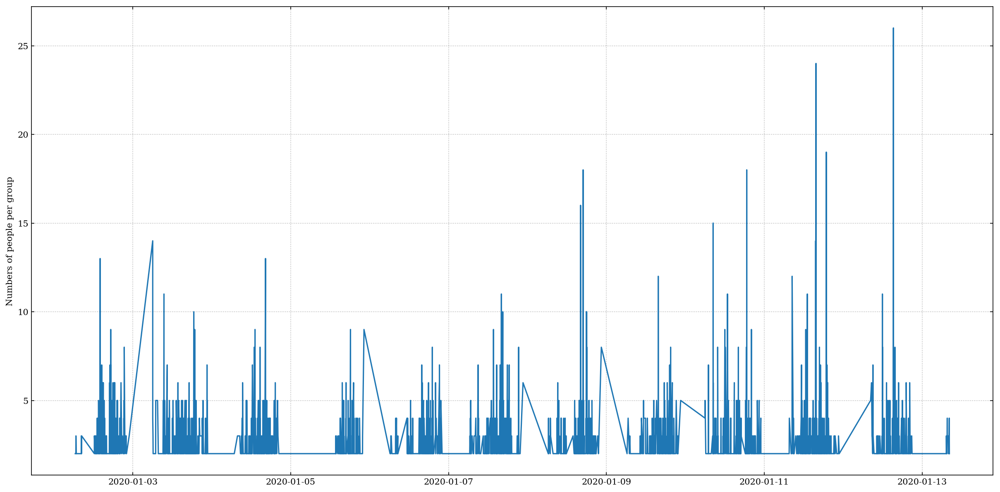

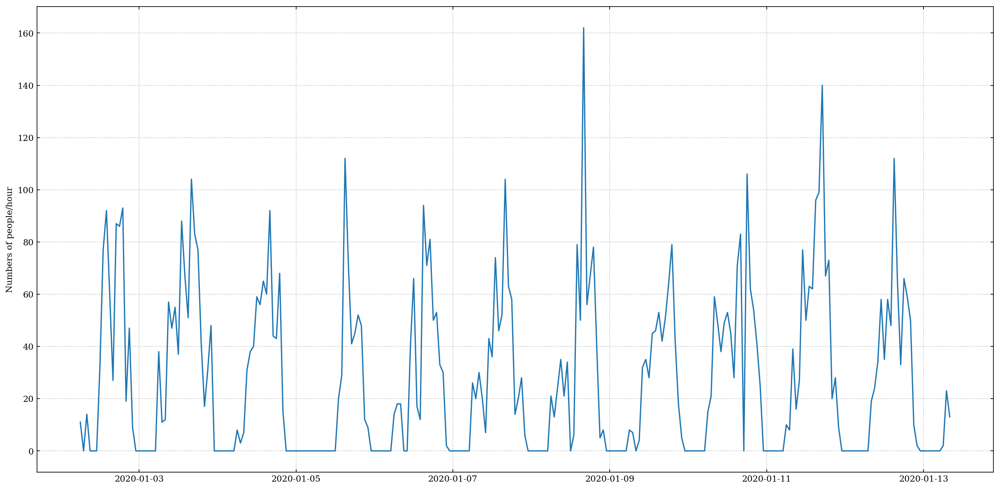

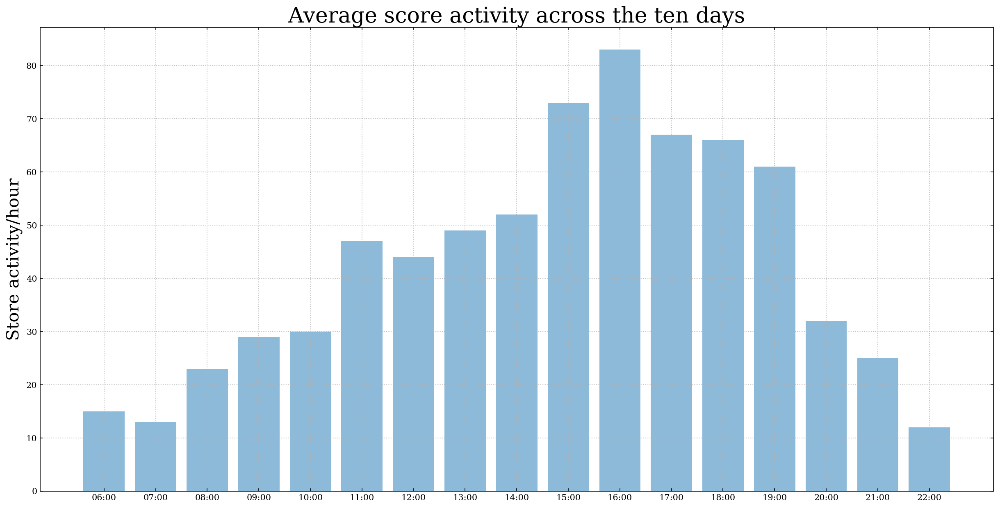

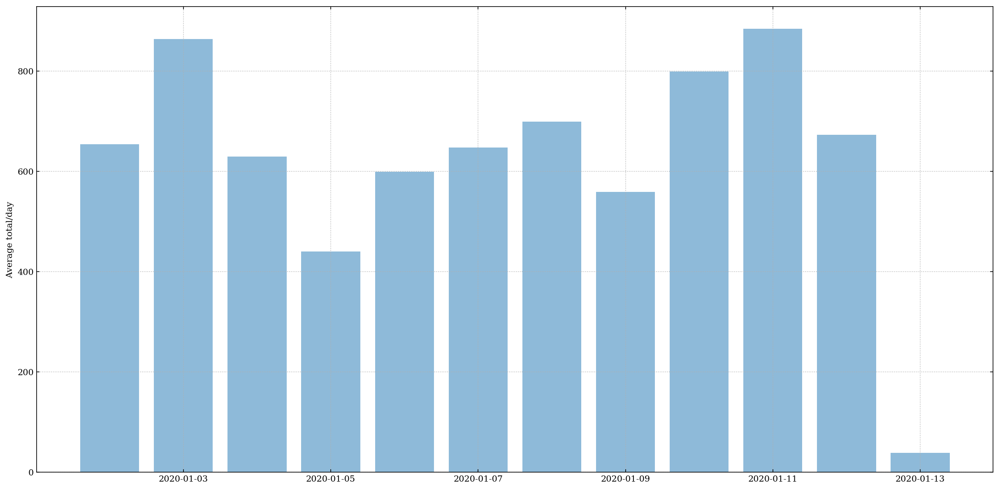

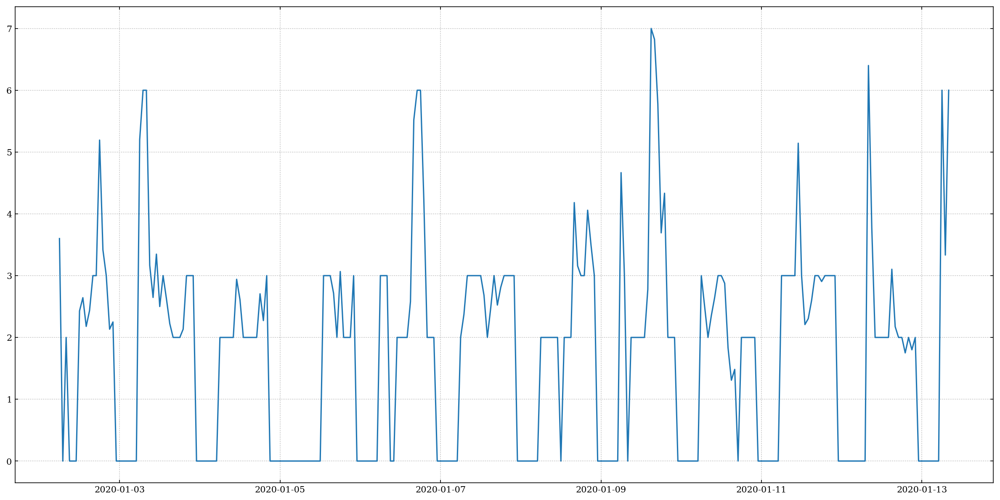

In [37]:
fig, ax = newfigure(figsize=(15,20))
ax.plot(data['feels_like']-273)
ax.set_ylabel("Temperature in deg C")
ax.plot(data['temp']-273)
ax.legend()
fig, ax = newfigure()
ax.plot(data['section_counter'])
ax.set_ylabel("Numbers of people per group")
fig, ax = newfigure()
ax.plot(sum_data_hour['section_counter'])
ax.set_ylabel("Numbers of people/hour")
fig, ax = newfigure()
ax.bar(dailyHours, dailyHoursTotals, align='center', alpha=0.5)
ax.set_ylabel("Store activity/hour", fontsize = 20)
ax.set_title('Average score activity across the ten days',fontsize=25)
fig, ax = newfigure()
ax.bar(sum_data_day['section_counter'].index,sum_data_day['section_counter'], alpha=0.5)
ax.set_ylabel("Average total/day")
fig, ax = newfigure()
ax.plot(mean_data_hour['description'])

In [14]:
def resample_direction_bus(data):
    data = data.fillna(0)
    data = data.resample('1H').mean()
    dailyHours, dailyHoursTotals = valuesEveryHour(data)
    plt.bar(dailyHours,dailyHoursTotals)
    

In [15]:
to77 = data.loc[data['bus_number'] == '77'].loc[data['bus_direction']=='to'].loc[data['0.5min'] != 0]
from77 = data.loc[data['bus_number'] == '77'].loc[data['bus_direction']=='from'].loc[data['0.5min'] != 0]

to452 = data.loc[data['bus_number'] == '452'].loc[data['bus_direction']=='to'].loc[data['0.5min'] != 0]
from452 = data.loc[data['bus_number'] == '452'].loc[data['bus_direction']=='from'].loc[data['0.5min'] != 0]

toP5 = data.loc[data['bus_number'] == 'p5'].loc[data['bus_direction']=='to'].loc[data['0.5min'] != 0]
fromP5 = data.loc[data['bus_number'] == 'p5'].loc[data['bus_direction']=='from'].loc[data['0.5min'] != 0]

to87 = data.loc[data['bus_number'] == '87'].loc[data['bus_direction']=='to'].loc[data['0.5min'] != 0]
from87 = data.loc[data['bus_number'] == '87'].loc[data['bus_direction']=='from'].loc[data['0.5min'] != 0]

noBus = data.loc[data['0.5min'] == 0]
bus = data.loc[data['0.5min'] != 0]


Text(0.5, 1.0, '452F')

Text(0.5, 1.0, '452T')

Text(0.5, 1.0, '77F')

Text(0.5, 1.0, '77T')

Text(0.5, 1.0, '87F')

Text(0.5, 1.0, '87T')

Text(0.5, 1.0, 'P5F')

Text(0.5, 1.0, 'P5T')

Text(0, 0.5, 'Store activity')

Text(0, 0.5, 'Store activity')

Text(0, 0.5, 'Store activity')

Text(0, 0.5, 'Store activity')

Text(0, 0.5, 'Store activity')

Text(0, 0.5, 'Store activity')

Text(0, 0.5, 'Store activity')

Text(0, 0.5, 'Store activity')

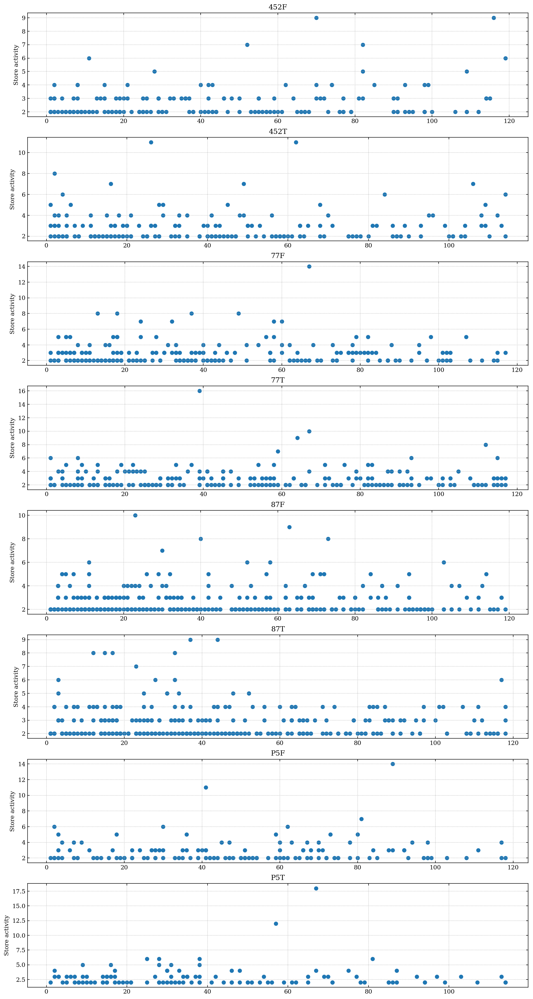

In [16]:
fig, ax = newfigure(8, figsize=(15,30))
ax[0].scatter(from452['0.5min'],from452['section_counter'])
ax[0].set_title('452F')
ax[1].scatter(to452['0.5min'],to452['section_counter'])
ax[1].set_title('452T')
ax[2].scatter(from77['0.5min'],from77['section_counter'])
ax[2].set_title('77F')
ax[3].scatter(to77['0.5min'],to77['section_counter'])
ax[3].set_title('77T')
ax[4].scatter(from87['0.5min'],from87['section_counter'])
ax[4].set_title('87F')
ax[5].scatter(to87['0.5min'],to87['section_counter'])
ax[5].set_title('87T')

ax[6].scatter(fromP5['0.5min'],fromP5['section_counter'])
ax[6].set_title('P5F')
ax[7].scatter(toP5['0.5min'],toP5['section_counter'])
ax[7].set_title('P5T')
for i in range(8):
    ax[i].set_ylabel('Store activity')
fig.savefig('./Graphs/Scatter.png')

Text(0.5, 0, 'Number of recent buses')

Text(0, 0.5, 'Store activity')

Text(0.5, 1.0, "Spearman's rank correlation: 0.77")

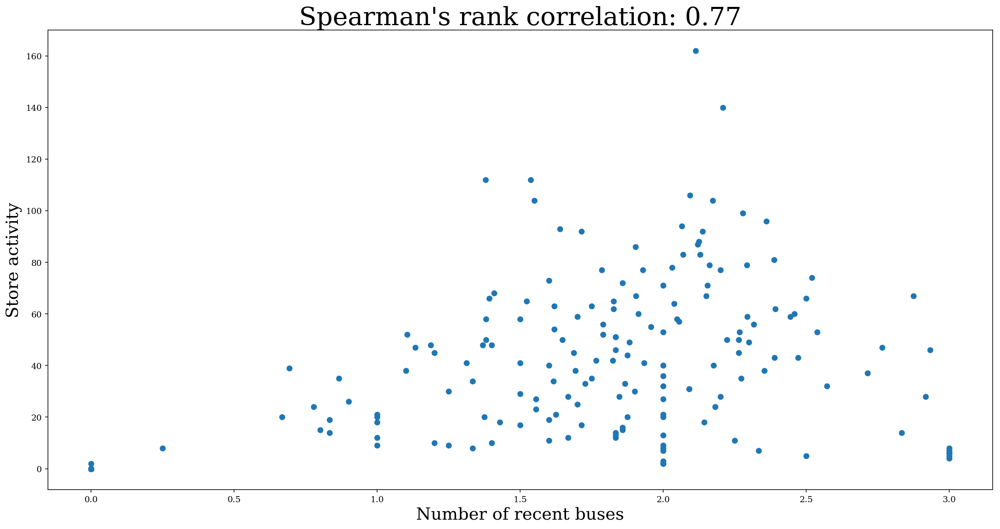

In [17]:
plt.scatter(mean_data_hour.recent_buses,sum_data_hour.section_counter)
plt.xlabel('Number of recent buses',fontsize=20)
plt.ylabel('Store activity', fontsize = 20)
plt.title("Spearman's rank correlation: " + str(mean_data_hour.recent_buses.corr(sum_data_hour.section_counter, method='spearman').round(2)),fontsize=30)
plt.savefig('./Graphs/Score_activity_recent_buses')

<Figure size 1500x1050 with 0 Axes>

(-0.5, 799.5, 499.5, -0.5)

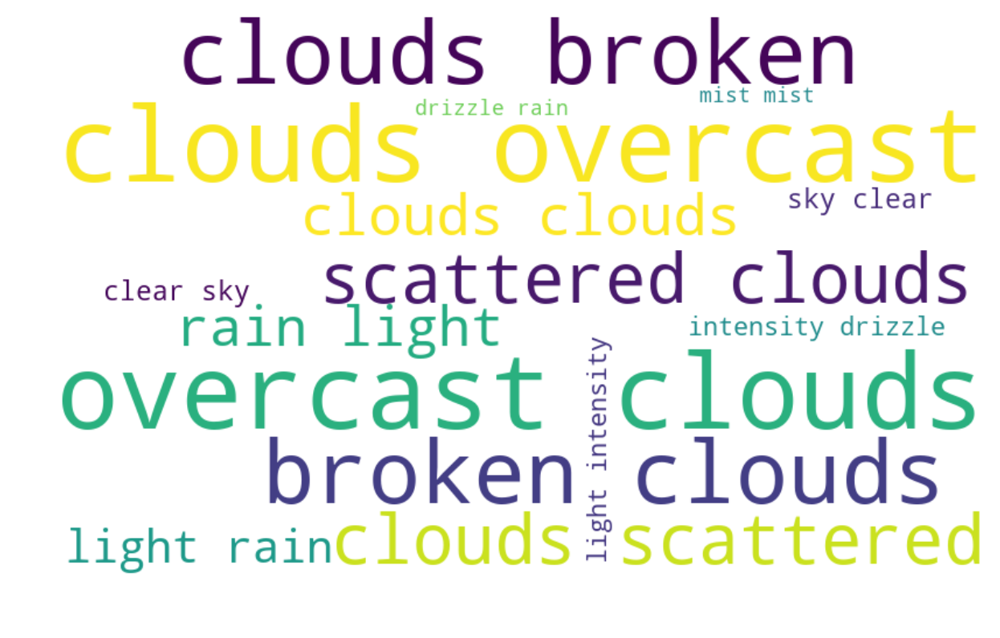

In [18]:
all_words = ' '.join([text for text in data_words["description"]])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110, max_words=15, background_color="white").generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
wordcloud.to_file("./graphs/wordmap.png")
plt.axis('off')
plt.show()

Text(0, 0.5, 'Store activity')

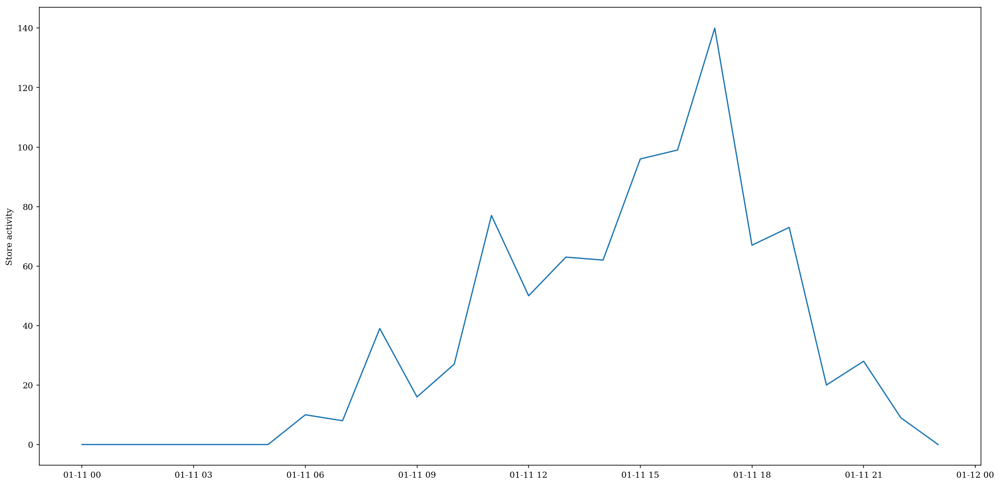

Text(0, 0.5, 'Weather Descriptor')

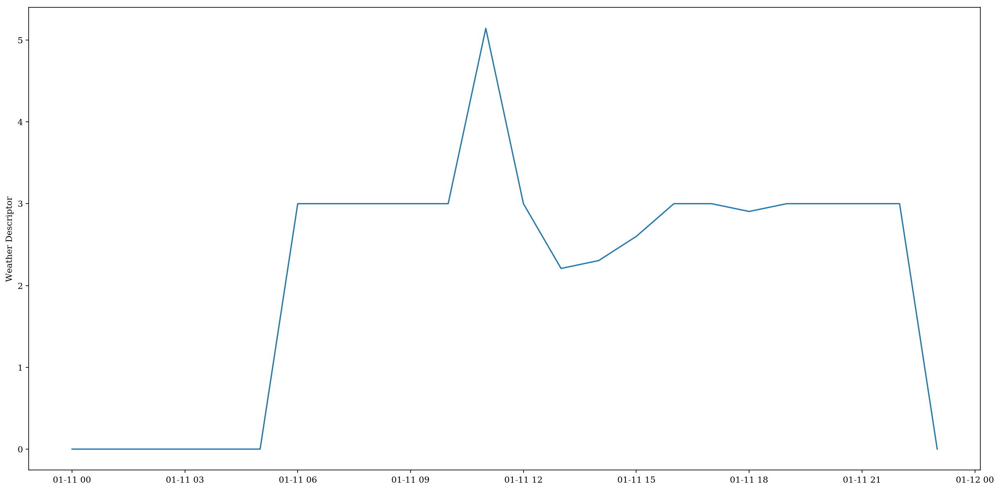

In [27]:
Saturday_activity = sum_data_hour.loc[sum_data_hour.index.day == 11]
Saturday_weather = mean_data_hour.loc[mean_data_hour.index.day == 11]
plt.plot(Saturday_activity['section_counter'])
plt.ylabel('Store activity')
plt.savefig('./Graphs/Saturday_counter.png')
plt.show()
plt.plot(Saturday_weather['description'])
plt.ylabel('Weather Descriptor')
plt.savefig('./Graphs/description.png')
plt.show()

In [20]:
activity_counter = sum_data_hour['section_counter']
Activity_range = (activity_counter.loc[activity_counter.idxmax()],activity_counter.loc[activity_counter.idxmin()])
Activity_mean = sum_data_hour['section_counter'].mean()

current = mean_data_hour.drop([item for item in mean_data_hour.index if mean_data_hour.loc[item]['temp'] == 0], axis = 0)
Temperature_mean = current['temp'].mean()-273
Temperature_range = (current['temp'].loc[current['temp'].idxmax()]-273,current['temp'].loc[current['temp'].idxmin()]-273)



Temperature_mean


8.533400931775589

Text(0.5, 1.0, "Spearman's rank correlation: 0.06")

Text(0.5, 1.0, "Spearman's rank correlation: 0.05")

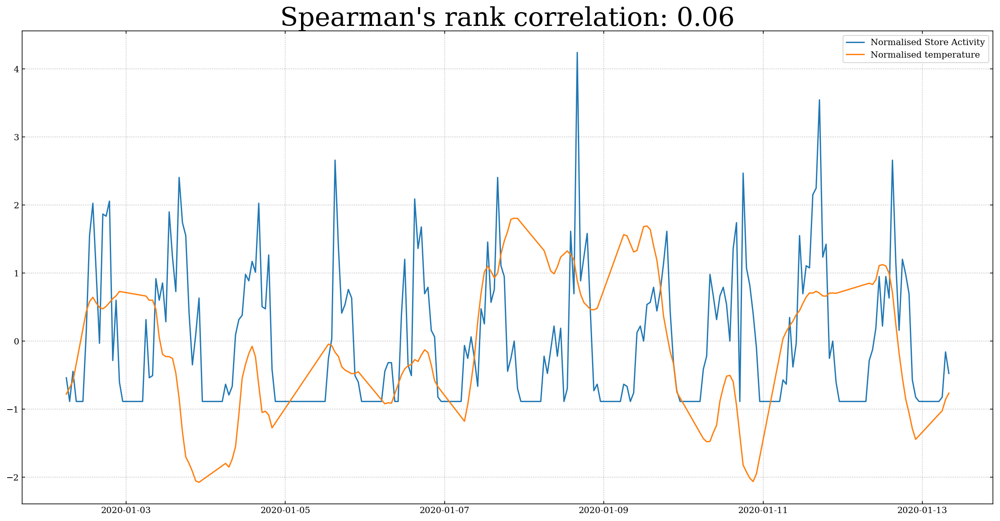

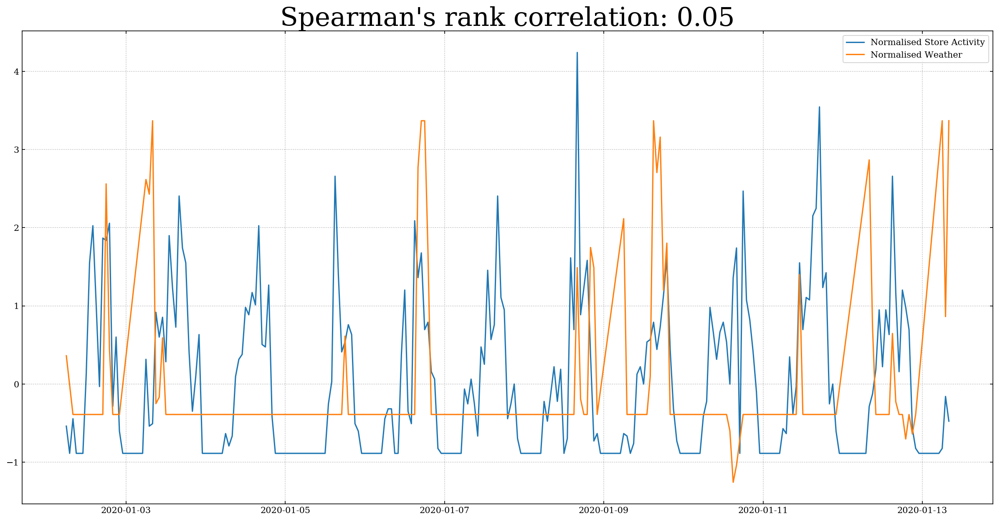

In [21]:
n_hour_activity = (activity_counter - activity_counter.mean())/activity_counter.std()
n_hour_temp =  mean_data_hour.drop([item for item in mean_data_hour.index if mean_data_hour.loc[item]['temp'] == 0], axis = 0)
n_hour_temp = (n_hour_temp['temp']-n_hour_temp['temp'].mean())/n_hour_temp['temp'].std()

n_hour_weather = mean_data_hour.drop([item for item in mean_data_hour.index if mean_data_hour.loc[item]['main'] == 0], axis = 0)
n_hour_weather = (n_hour_weather['main']-n_hour_weather['main'].mean())/n_hour_weather['main'].std()
fig, ax = newfigure()
ax.plot(n_hour_activity,label = 'Normalised Store Activity')
ax.plot((n_hour_temp), label= "Normalised temperature")
ax.set_title("Spearman's rank correlation: " + str(n_hour_activity.corr(n_hour_temp, method='spearman').round(2)),fontsize=30)
ax.legend()
fig.savefig('./Graphs/Normalised_activity_temp.png')
fig, ax = newfigure()
ax.plot(n_hour_activity,label = 'Normalised Store Activity')
ax.plot((n_hour_weather), label= "Normalised Weather")
ax.set_title("Spearman's rank correlation: " + str(n_hour_activity.corr(n_hour_weather, method='spearman').round(2)),fontsize=30)
ax.legend()
fig.savefig('./Graphs/Normalised_activity_weather.png')

In [22]:
pac1 = sum_data_hour['section_counter'].corr(sum_data_hour['section_counter'])
pac2 = sum_data_day['section_counter'].corr(sum_data_day['section_counter'])
pac1
pac2

0.9999999999999999

1.0

In [23]:
temp_section_corr = sum_data_hour.section_counter.corr(mean_data_hour.temp)
feels_section_corr = sum_data_hour.section_counter.corr(mean_data_hour.feels_like)

bus_section_corr = mean_data_hour.section_counter.corr(mean_data_hour['0.5min'],method = 'spearman')
num_bus_corr = mean_data_hour.recent_buses.corr(sum_data_hour.section_counter, method = 'spearman')
#bus_section_corr = sum_data_hour.section_counter.corr(mean_data_hour['0.5min'],method = 'kendall')
#bus_section_corr = sum_data_hour.section_counter.corr(mean_data_hour['0.5min'],method = 'pearson')
num_bus_corr


0.7734261952391464

Text(0.5, 1.0, 'section_counter')

Text(0.5, 1.0, 'main')

Text(0.5, 1.0, 'description')

Text(0.5, 1.0, 'feels_like')

Text(0.5, 1.0, 'temp')

Text(0.5, 1.0, 'clouds')

Text(0.5, 1.0, 'wind_speed')

Text(0.5, 1.0, 'recent_buses')

Text(0.5, 1.0, 'most_recent')

Text(0.5, 1.0, 'ts')

Text(0.5, 1.0, '0.5min')

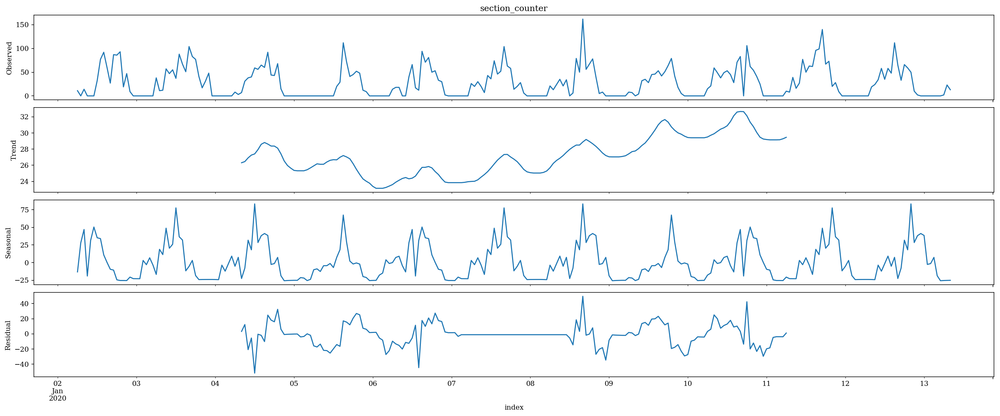

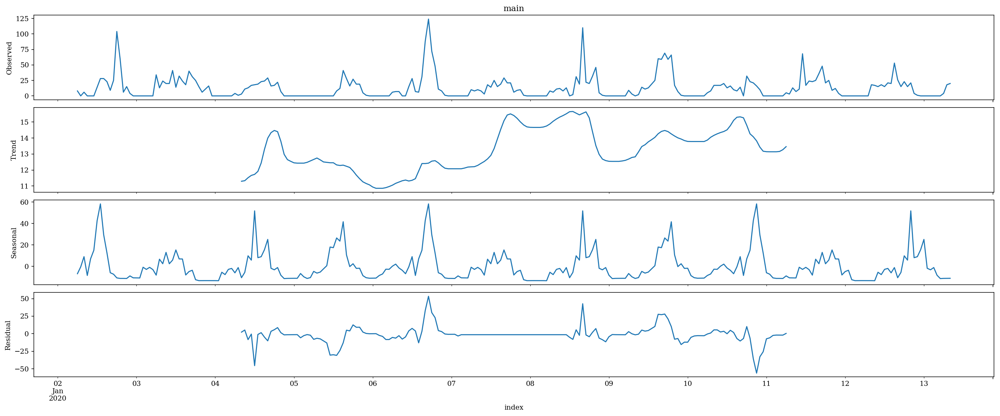

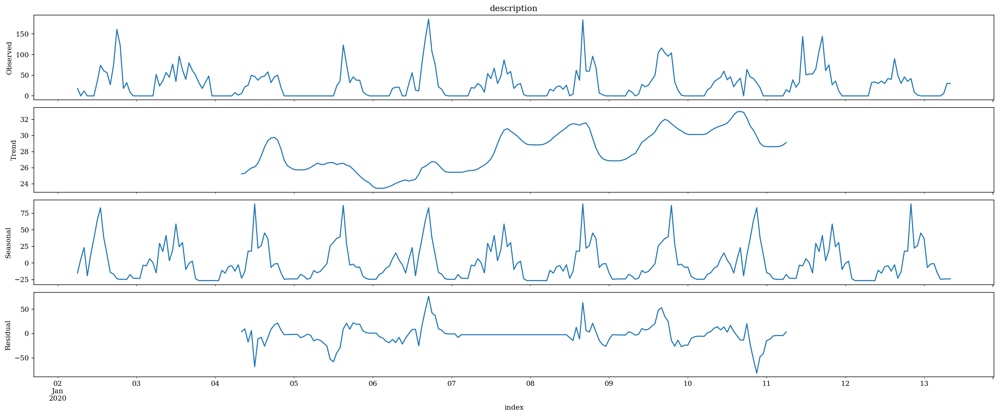

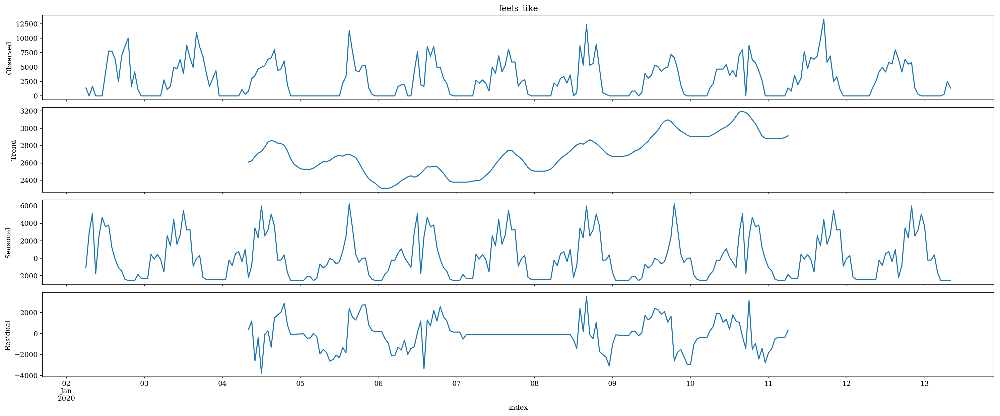

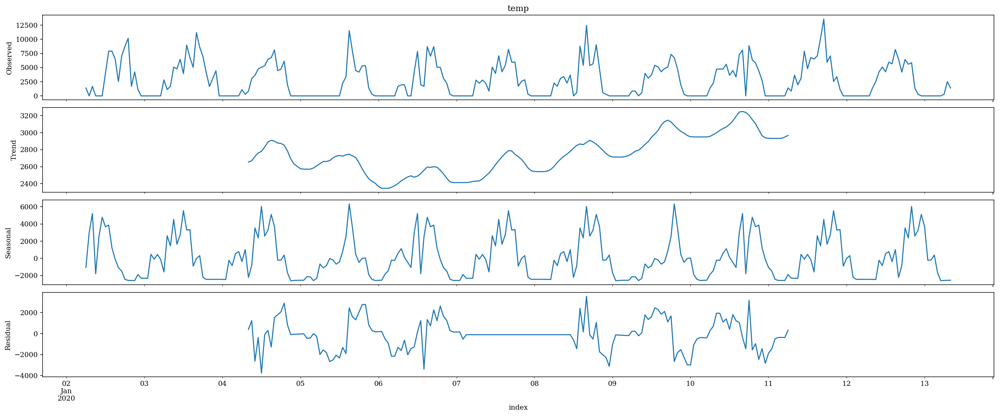

...

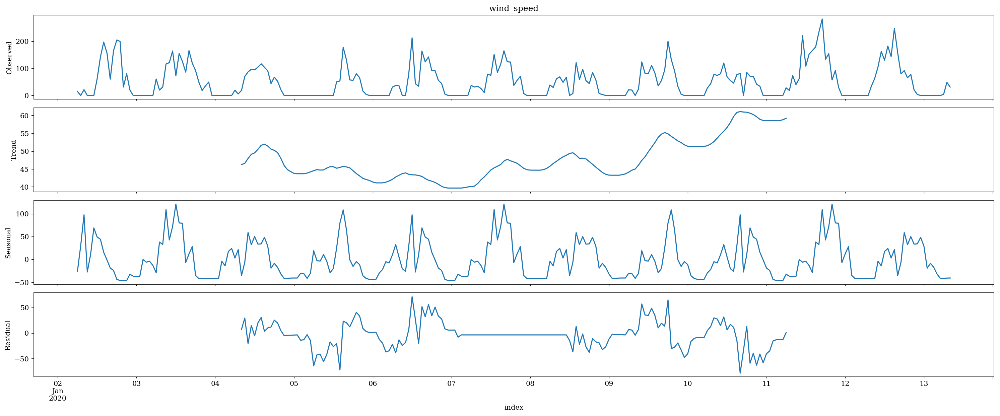

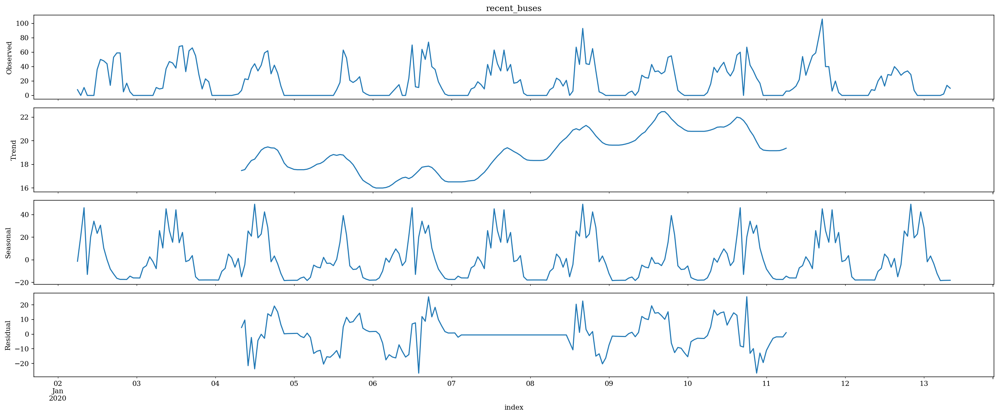

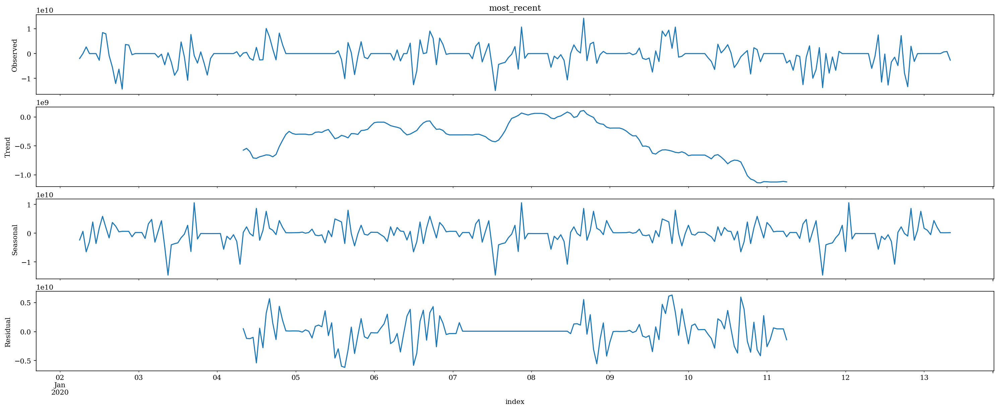

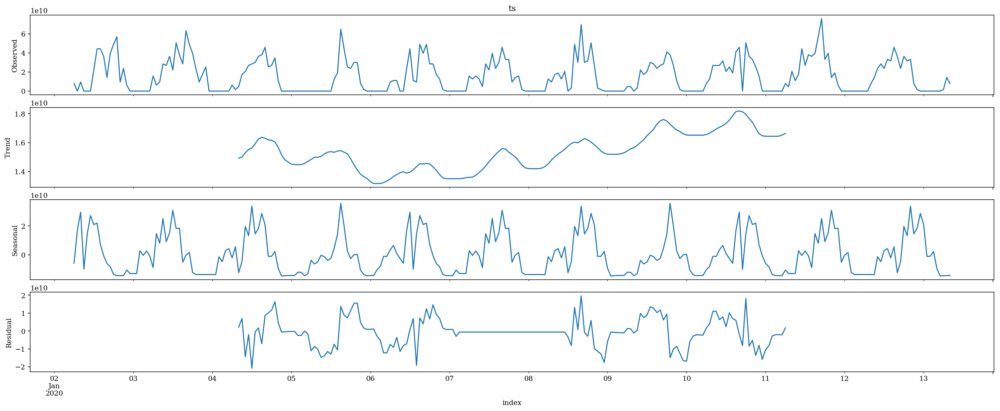

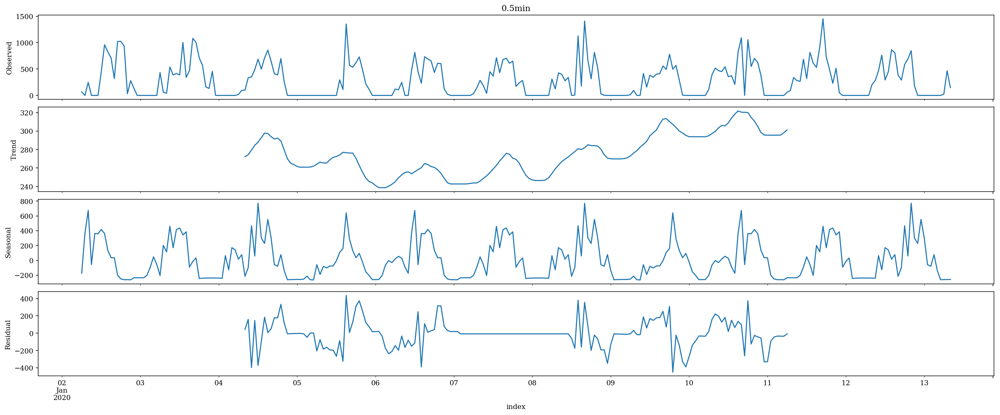

In [24]:
trend_series = []
for i, name in enumerate(sum_data_hour.columns.values):
    decomposed = sm.tsa.seasonal_decompose(sum_data_hour[name],freq=100)
    trend_series.append(decomposed.trend)
    figure = decomposed.plot()
    figure.axes[0].set_title(name)
    figure.set_size_inches(20,8)

trends = pd.concat(trend_series, axis=1)
plt.show()

Text(0.5, 1.0, 'section_counter')

Text(0.5, 1.0, 'main')

Text(0.5, 1.0, 'description')

Text(0.5, 1.0, 'feels_like')

Text(0.5, 1.0, 'temp')

Text(0.5, 1.0, 'clouds')

Text(0.5, 1.0, 'wind_speed')

Text(0.5, 1.0, 'recent_buses')

Text(0.5, 1.0, 'most_recent')

Text(0.5, 1.0, 'ts')

Text(0.5, 1.0, '0.5min')

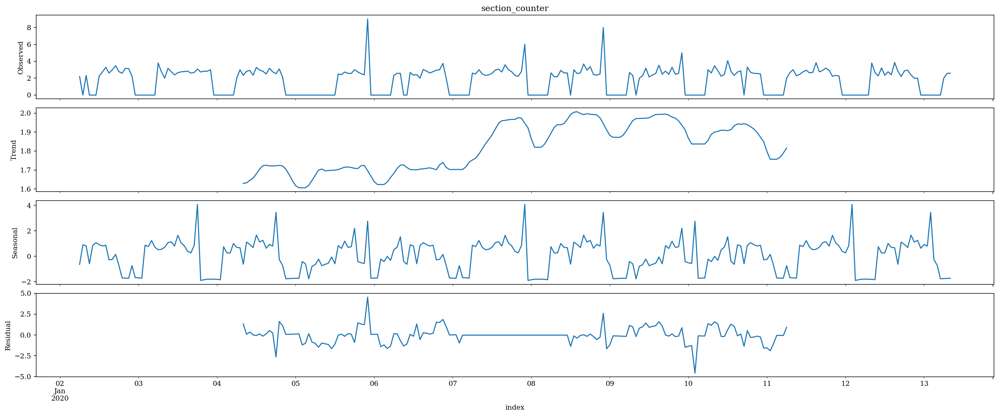

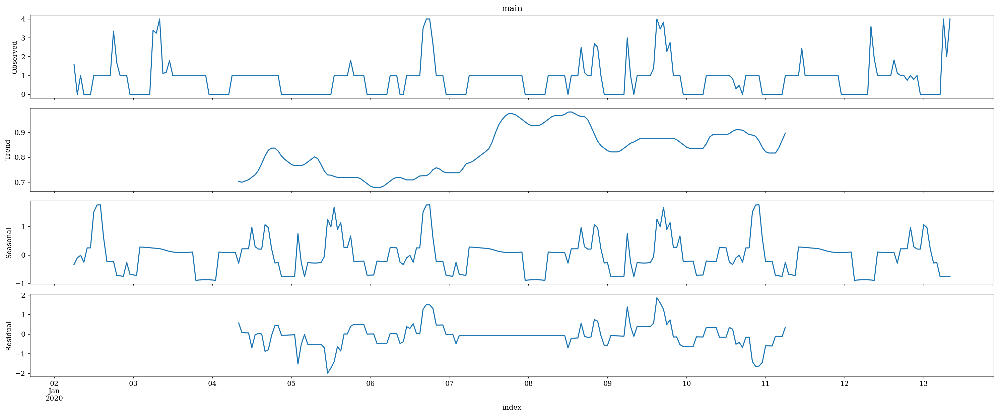

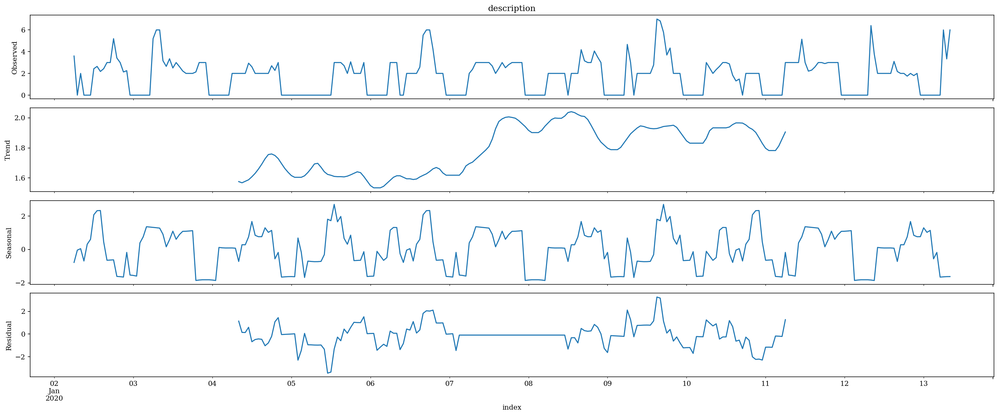

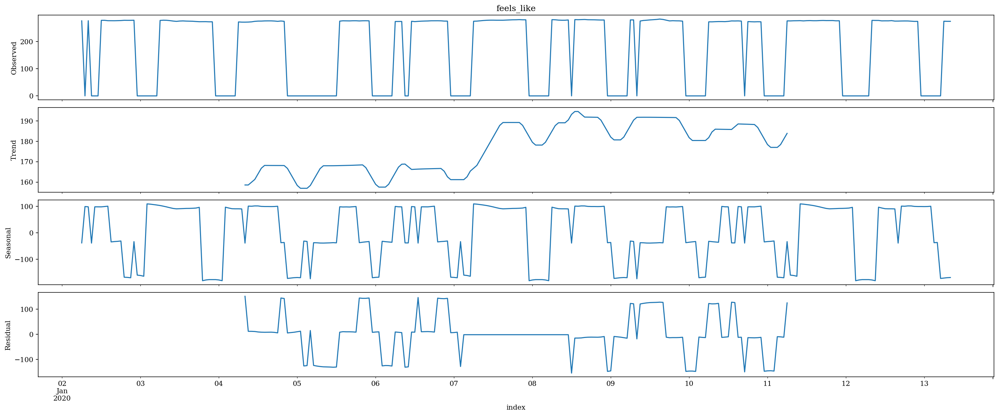

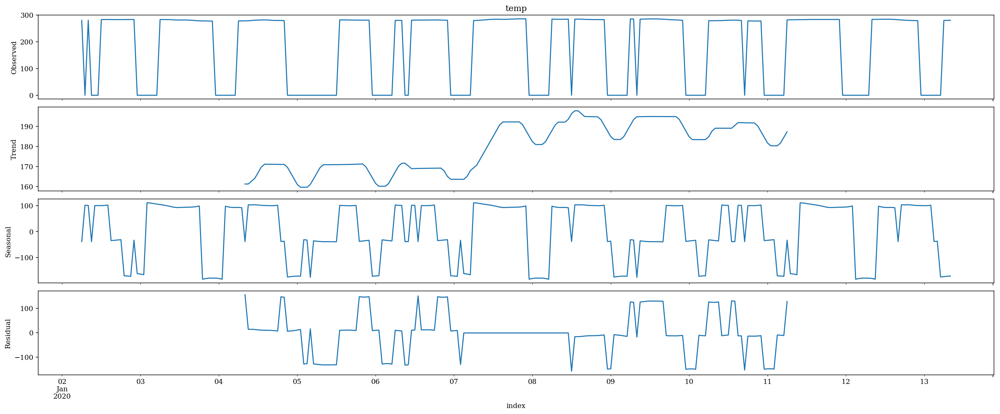

...

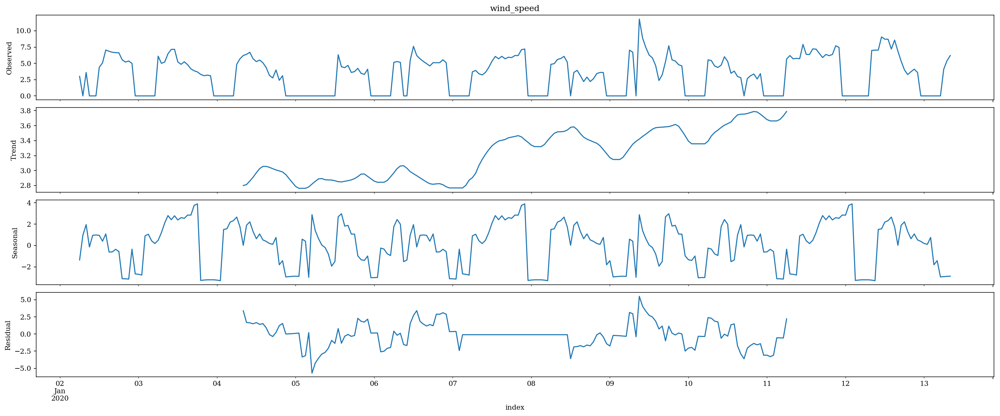

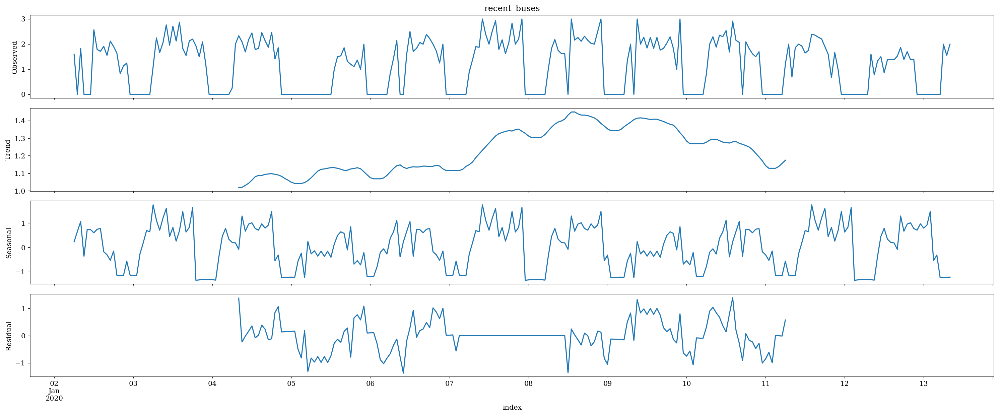

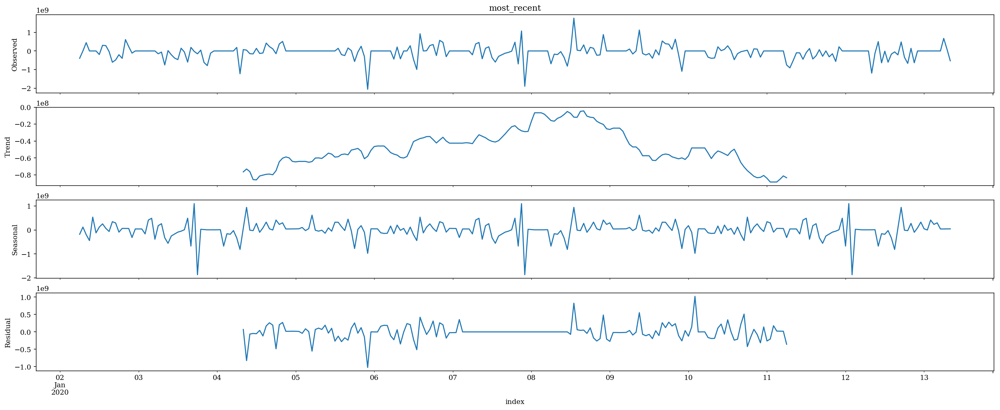

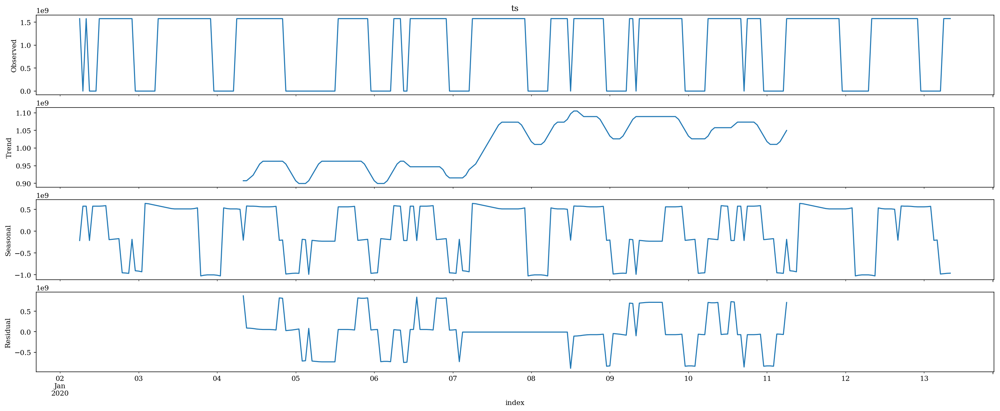

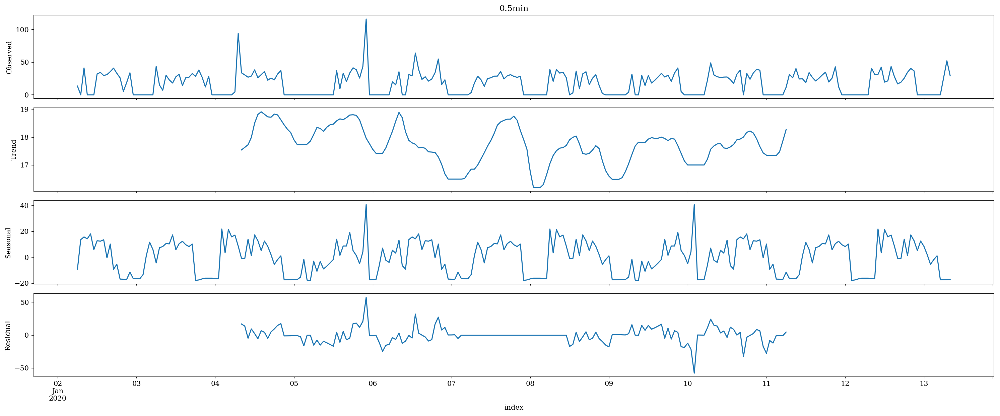

In [25]:
trend_series = []
for i, name in enumerate(mean_data_hour.columns.values):
    decomposed = sm.tsa.seasonal_decompose(mean_data_hour[name],freq=100)
    trend_series.append(decomposed.trend)
    figure = decomposed.plot()
    figure.axes[0].set_title(name)
    figure.set_size_inches(20,8)

Text(0.5, 1.0, 'Store Activity')

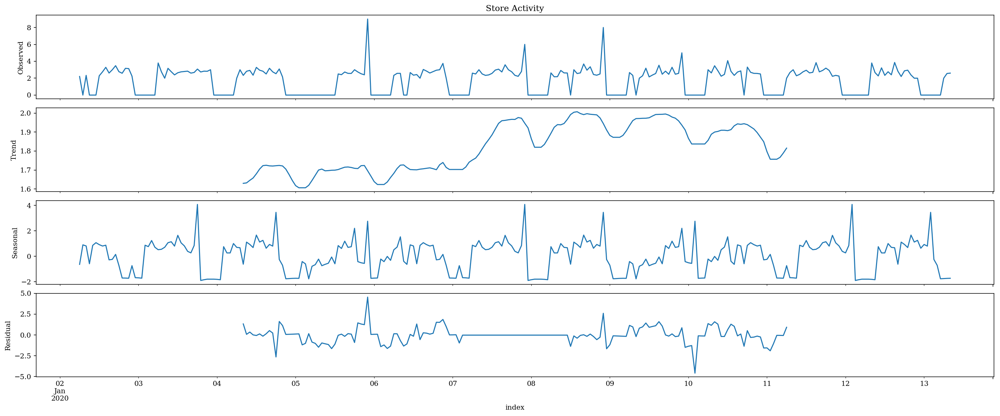

In [34]:
decomposed = sm.tsa.seasonal_decompose(mean_data_hour['section_counter'],freq=100)
trend_series.append(decomposed.trend)
figure = decomposed.plot()
figure.axes[0].set_title('Store Activity')
figure.set_size_inches(20,8)
